# 1. File Upload

In [ ]:
from google.colab import files
upload_file = files.upload()

Saving car1.jpg to car1.jpg


# 2. Load File

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

In [ ]:
print('OpenCV version :', cv2.__version__)

OpenCV version : 4.8.0


In [ ]:
!ls -al

total 96
drwxr-xr-x 1 root root  4096 Sep 20 15:34 .
drwxr-xr-x 1 root root  4096 Sep 20 15:26 ..
-rw-r--r-- 1 root root 77963 Sep 20 15:34 car1.jpg
drwxr-xr-x 4 root root  4096 Sep 18 13:36 .config
drwxr-xr-x 1 root root  4096 Sep 18 13:37 sample_data


In [ ]:
img = cv2.imread('car1.jpg')

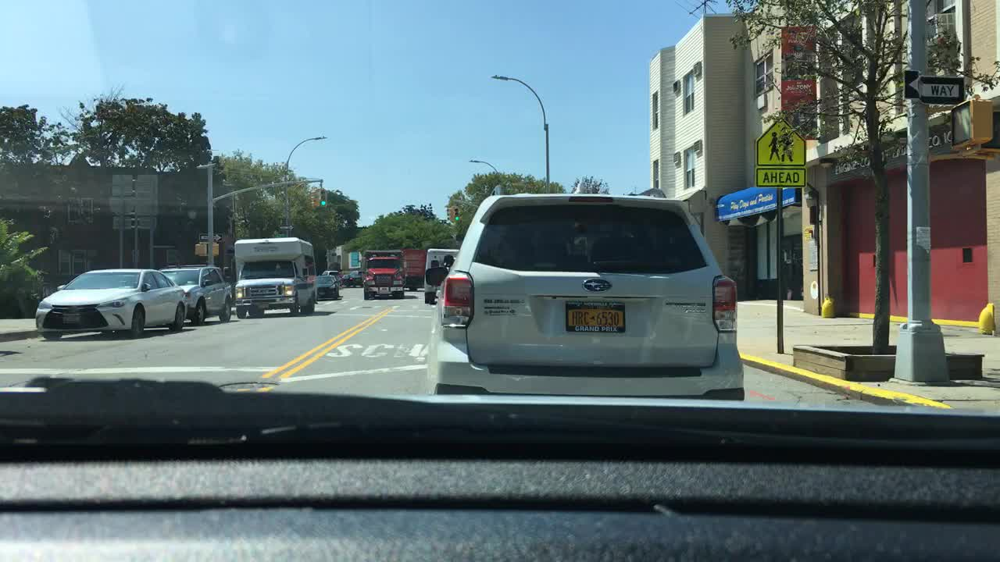

width : 1280 pixels
height : 720 pixels
channels : 3 pixels
720 1280 (640, 360)


In [ ]:
cv2_imshow(img)

print('width : {} pixels'.format(img.shape[1]))
print('height : {} pixels'.format(img.shape[0]))
print('channels : {} pixels'.format(img.shape[2]))

(height, width) = img.shape[:2]
center = (width//2, height //2)

print(height, width, center)

In [ ]:
X = 125 #@param {type:"slider", min :0, max:1280, step :1}
Y = 110 #@param {type:"slider", min :0, max:720, step :1}
SIZE = 125 #@param {type:"slider", min :0, max:1200, step :1}

In [ ]:
(b, g, r) = img[X, Y]
print("Pixel at ({}, {}) - Red : {}, Green: {}, Blue : {}".format(X, Y, r, g, b))

Pixel at (125, 110) - Red : 171, Green: 219, Blue : 241


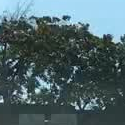

In [ ]:
# Crop cordination = image[y:y+h, x:x+w]
croped = img[Y:Y+SIZE, X:X+SIZE]
cv2_imshow(croped)

In [ ]:
background = np.full((height, width, 3), 255, np.uint8)

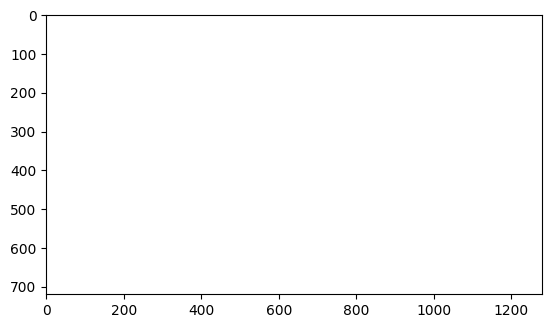

In [ ]:
plt.imshow(background)

In [ ]:
img[Y:Y+SIZE, X:X+SIZE] = (0, 0, 255)
background[Y:Y+SIZE, X:X+SIZE] = (0, 0, 255)

In [ ]:
cv2.rectangle(img, (X+SIZE*2, Y), (X+SIZE*3, Y+SIZE), (0, 255, 0), 5)
cv2.rectangle(background, (X+SIZE*2, Y), (X+SIZE*3, Y+SIZE), (0, 255, 0), 5)

In [ ]:
radius = int(SIZE/2)
cv2.circle(img, (X+SIZE*4, Y+radius), radius, (255, 255, 0), -1)
cv2.circle(background, (X+SIZE*4, Y+radius), radius, (255, 255, 0), -1)

In [ ]:
cv2.line(img, (X+SIZE*5, Y), (X+SIZE*6, Y+SIZE), (0, 255, 255), 5)
cv2.line(background, (X+SIZE*5, Y), (X+SIZE*6, Y+SIZE), (0, 255, 255), 5)

In [ ]:
cv2.putText(img, 'creApple', (X+SIZE*7, Y+SIZE), cv2.FONT_HERSHEY_COMPLEX, 1, (255, 0, 0))
cv2.putText(background, 'creApple', (X+SIZE*7, Y+SIZE), cv2.FONT_HERSHEY_COMPLEX, 1, (255, 0, 0))

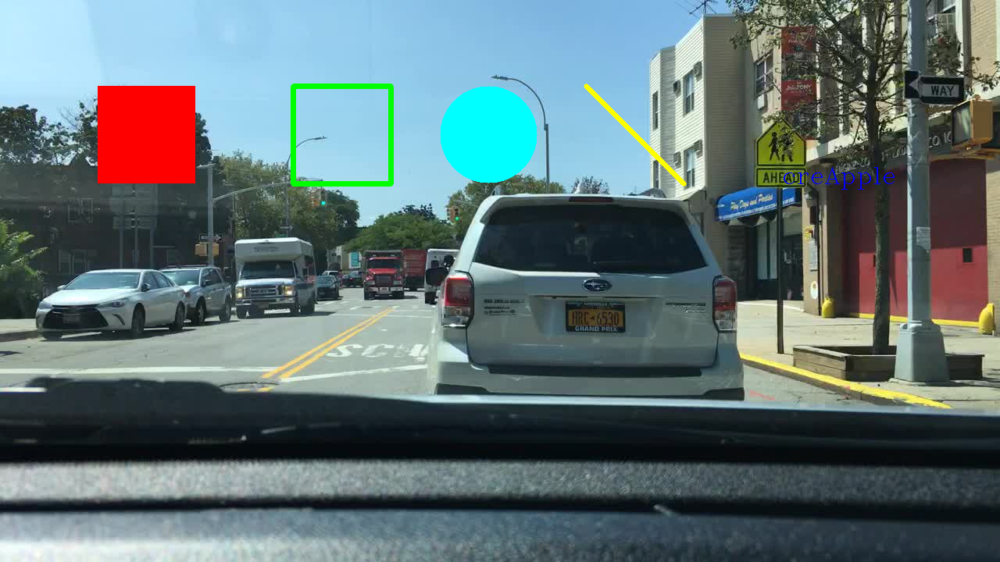

In [ ]:
cv2_imshow(img)

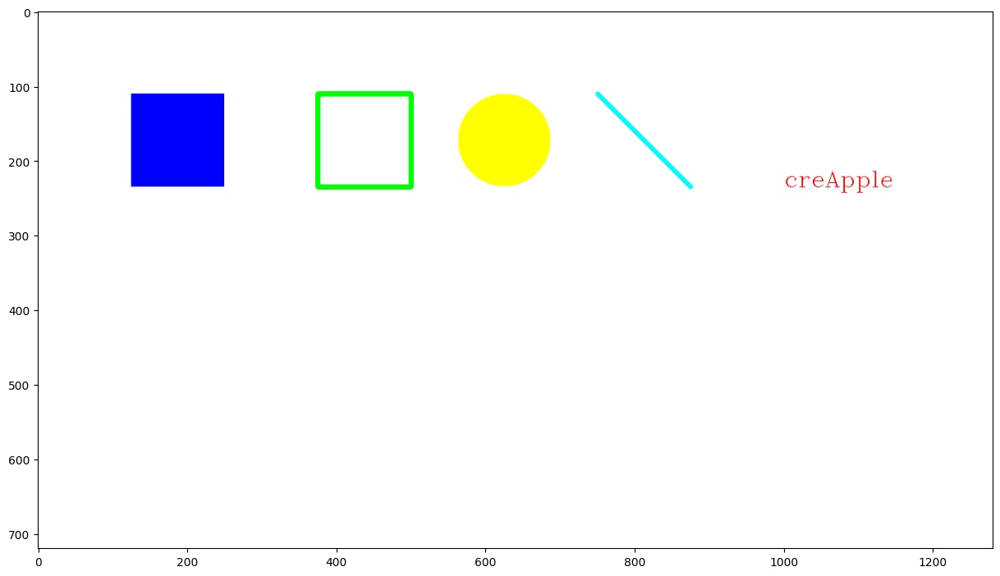

In [ ]:
plt.figure(figsize = (15, 15))
plt.imshow(background)

In [ ]:
cv2.imwrite('car-copy.jpg', img)

True

In [ ]:
cv2.imwrite('plt-copy.jpg', background)

True

In [ ]:
!ls -al

total 308
drwxr-xr-x 1 root root   4096 Sep 20 15:38 .
drwxr-xr-x 1 root root   4096 Sep 20 15:26 ..
-rw-r--r-- 1 root root  77963 Sep 20 15:34 car1.jpg
-rw-r--r-- 1 root root 181331 Sep 20 15:38 car-copy.jpg
drwxr-xr-x 4 root root   4096 Sep 18 13:36 .config
-rw-r--r-- 1 root root  31049 Sep 20 15:38 plt-copy.jpg
drwxr-xr-x 1 root root   4096 Sep 18 13:37 sample_data


In [ ]:
def downlad(path):
  try:
    from google.colab import files
    files.download(path)
  except:
    import os
    print('Error download:', os.path.join(os, getcwd(), path))

In [ ]:
downlad('plt-copy.jpg')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

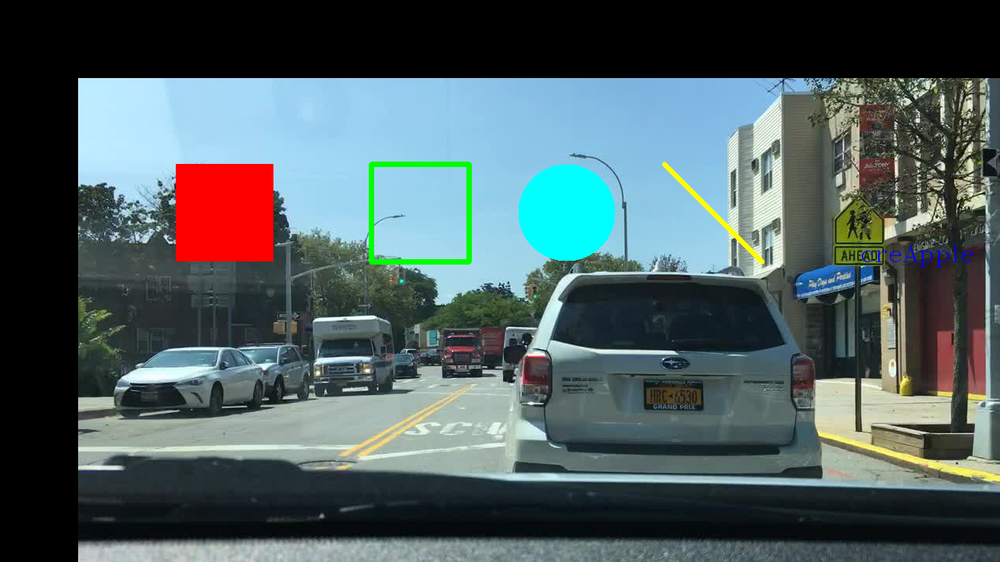

In [ ]:
# moved down : +, up : - and right : +, left -
move = np.float32([[1, 0, 100], [0, 1, 100]])
moved = cv2.warpAffine(img, move, (width,height))
cv2_imshow(moved)

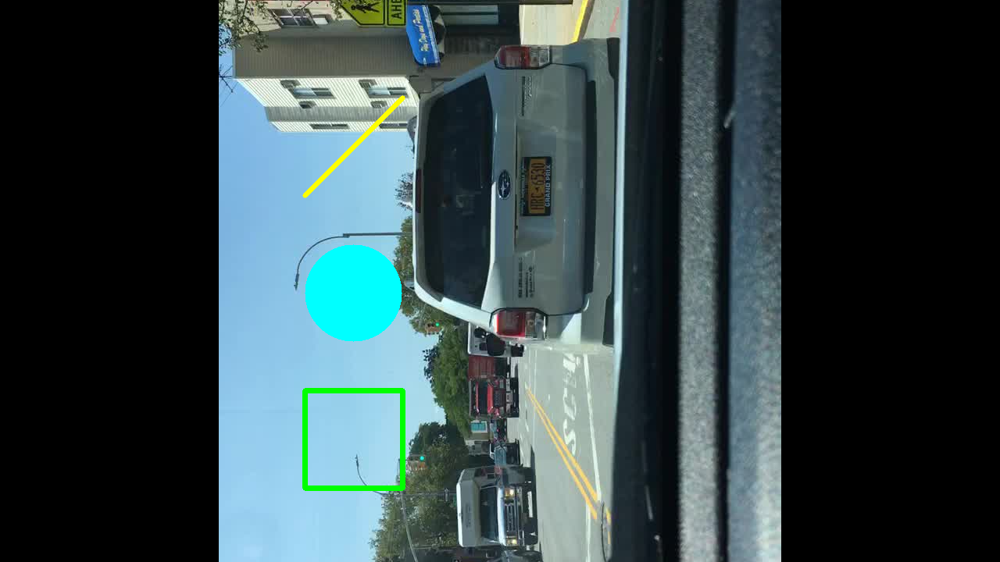

In [ ]:
roatate = cv2.getRotationMatrix2D(center, 90, 1.0)
rotated = cv2.warpAffine(img, roatate, (width, height))
cv2_imshow(rotated)

In [ ]:
ratio = SIZE / width
dimention = (SIZE, int(height*ratio))

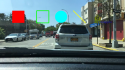

In [ ]:
resized = cv2.resize(img, dimention, interpolation=cv2.INTER_AREA)
cv2_imshow(resized)

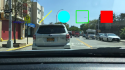

In [ ]:
# Flipped Horizontional 1, Vertical 0, both -1
flippend = cv2.flip(resized, 1)
cv2_imshow(flippend)

## Mask

In [ ]:
# White background = np.full((heightm width, 3), 255 ,np.uint8)
mask = np.zeros(img.shape[:2], dtype = 'uint8')

In [ ]:
img.shape[:2]

(720, 1280)

In [ ]:
cv2.circle(mask, center, int(height/2), (255, 255, 255), -1)

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

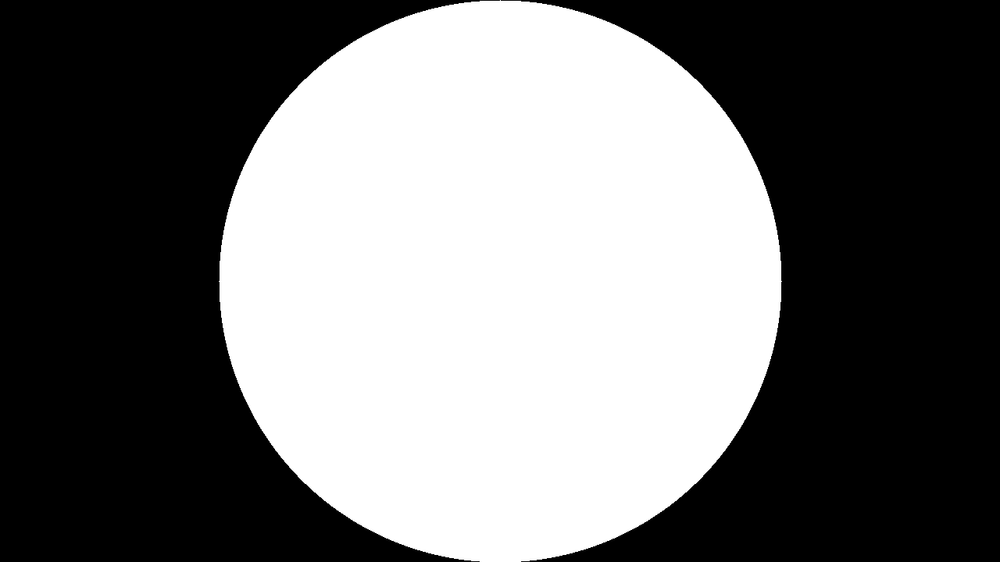

In [ ]:
cv2_imshow(mask)

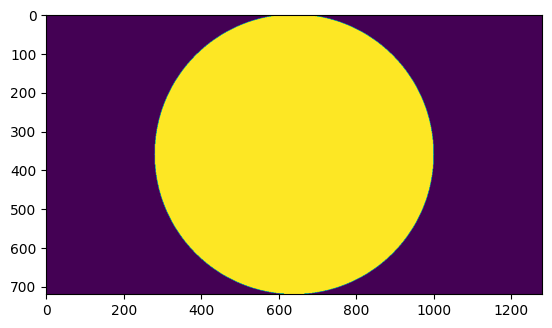

In [ ]:
plt.imshow(mask)

In [ ]:
masked = cv2.bitwise_and(img, img, mask=mask)

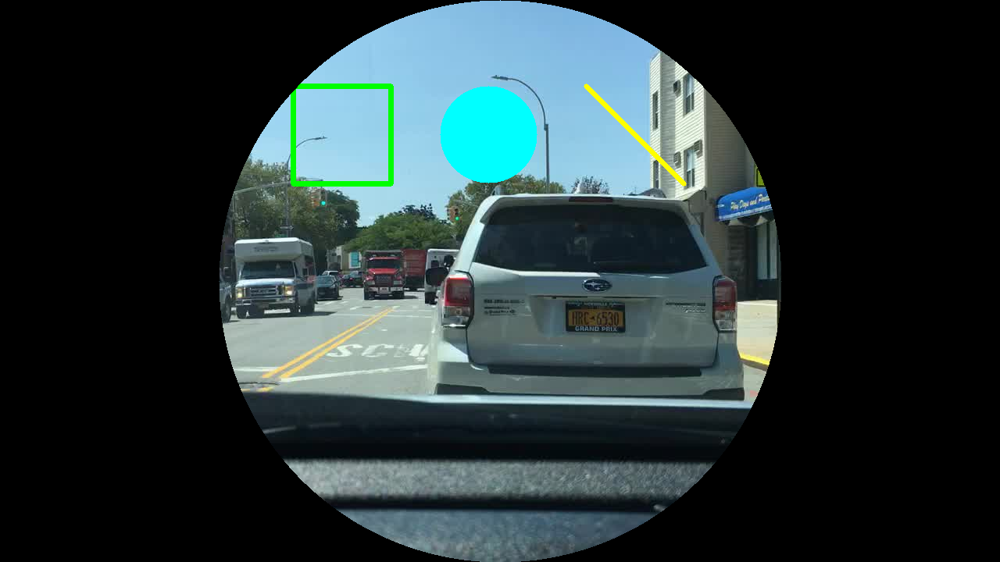

In [ ]:
cv2_imshow(masked)

# Filter

In [ ]:
zeros = np.zeros(img.shape[:2], np.uint8)

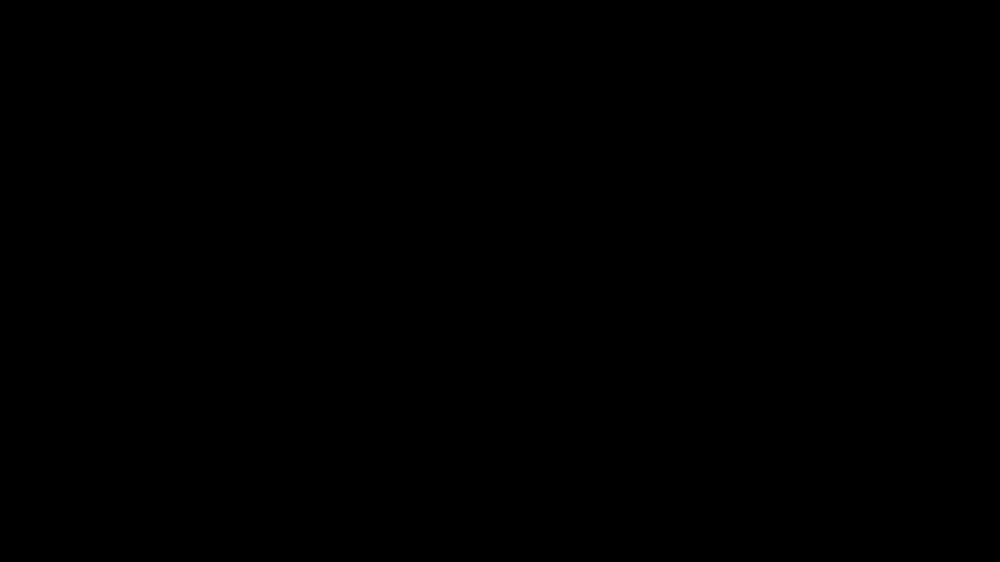

In [ ]:
cv2_imshow(zeros)

In [ ]:
(Blue, Green, Red) = cv2.split(img)

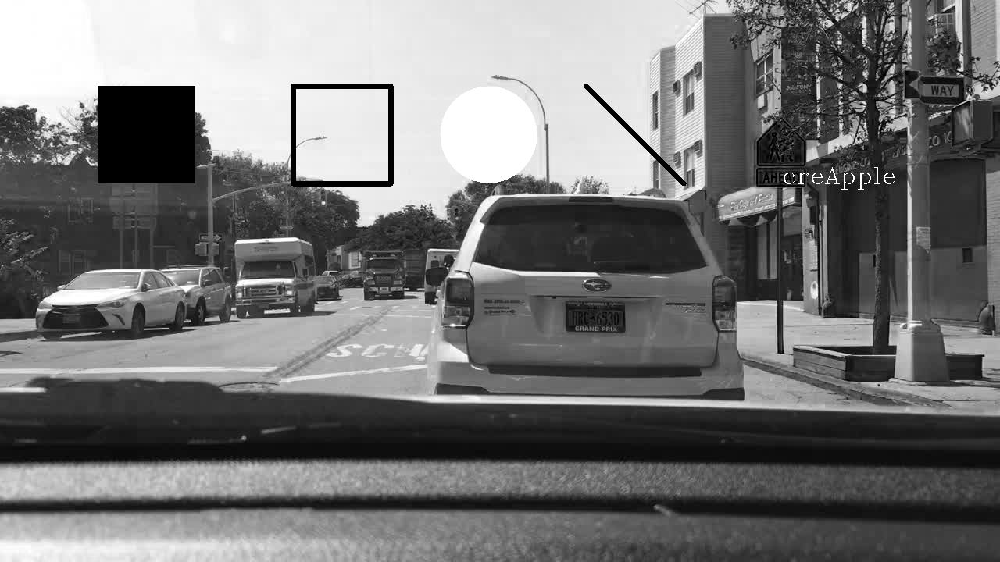

In [ ]:
cv2_imshow(Blue)

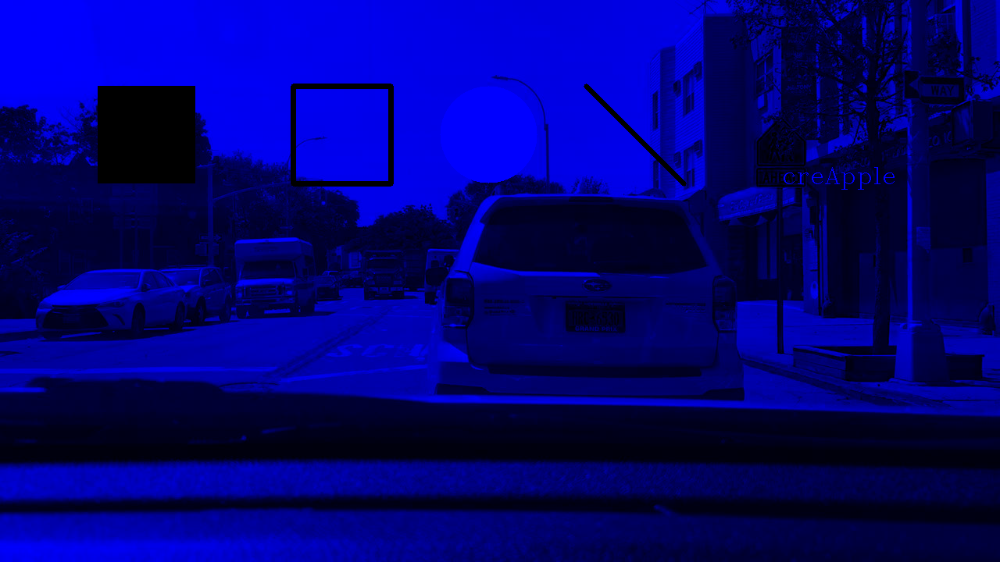

In [ ]:
cv2_imshow(cv2.merge([Blue, zeros, zeros]))

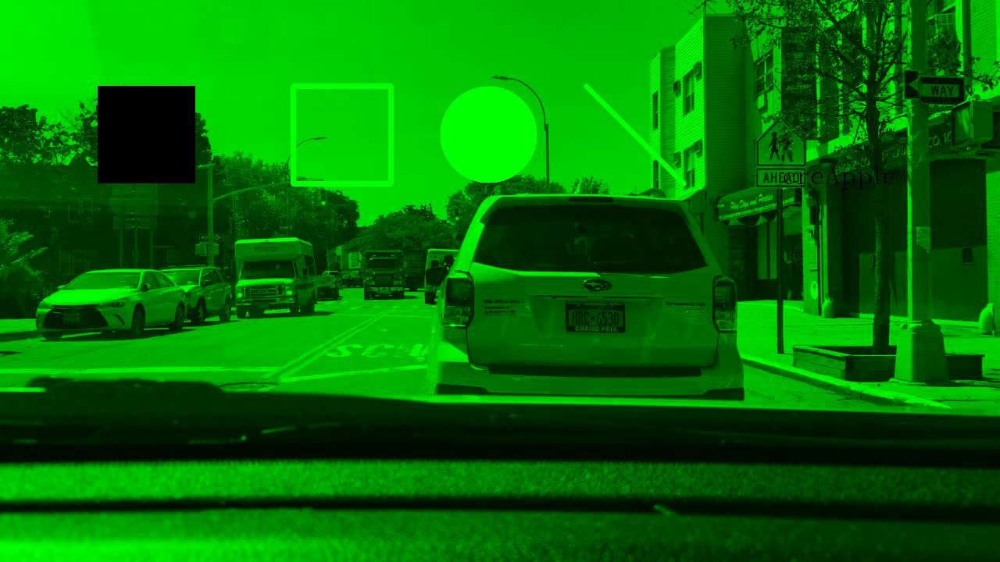

In [ ]:
cv2_imshow(cv2.merge([zeros, Green, zeros]))

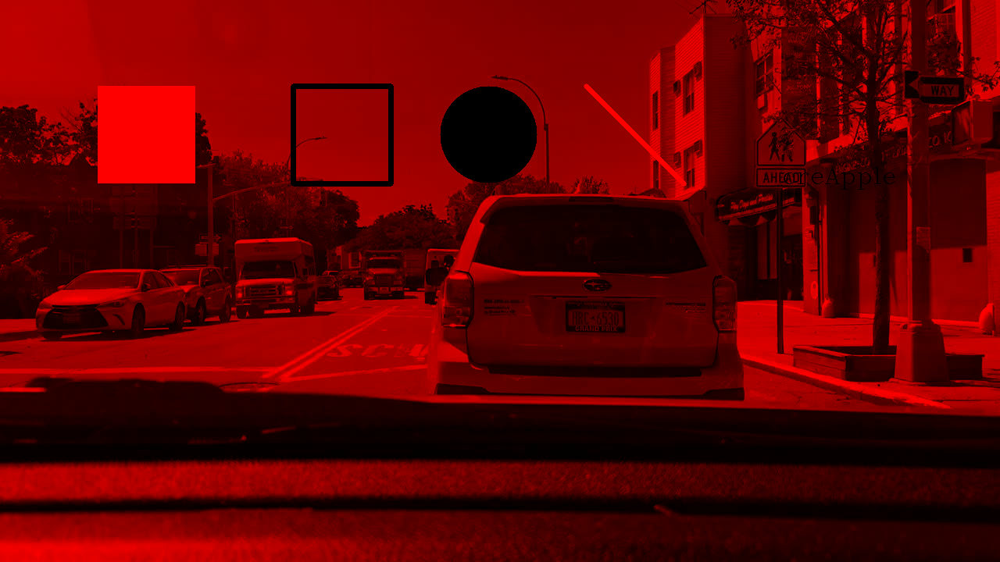

In [ ]:
cv2_imshow(cv2.merge([zeros, zeros, Red]))

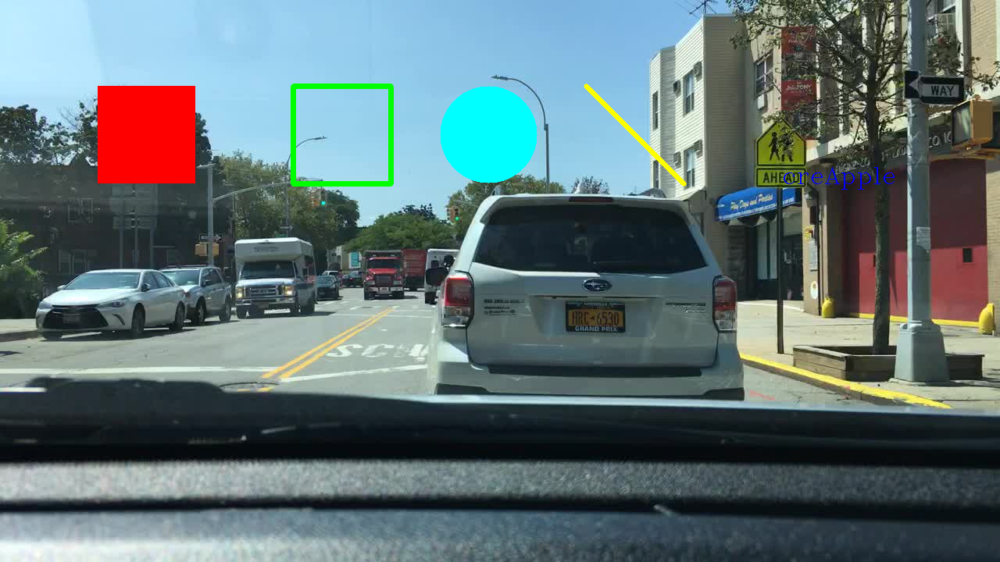

In [ ]:
cv2_imshow(cv2.merge([Blue, Green, Red]))

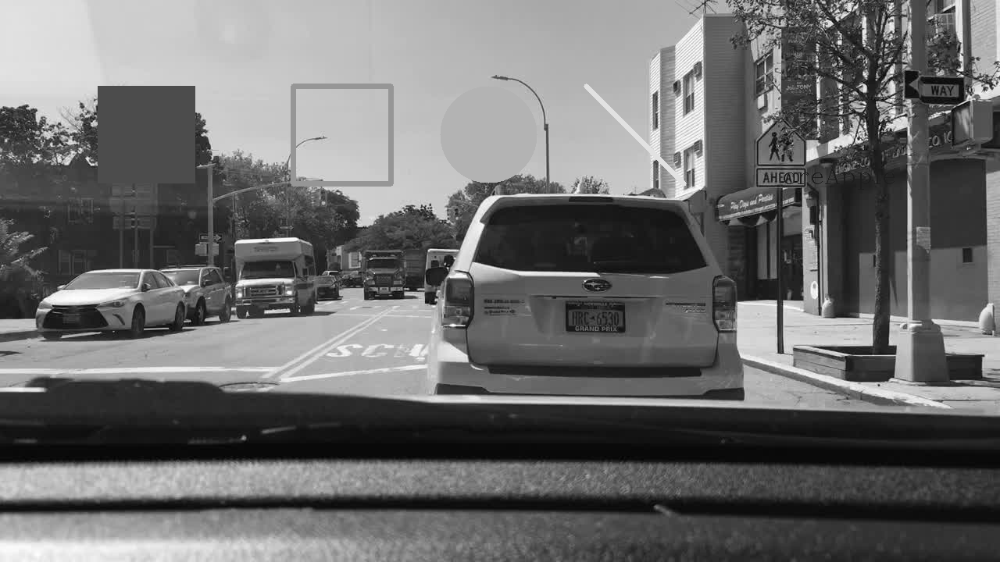

In [ ]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)

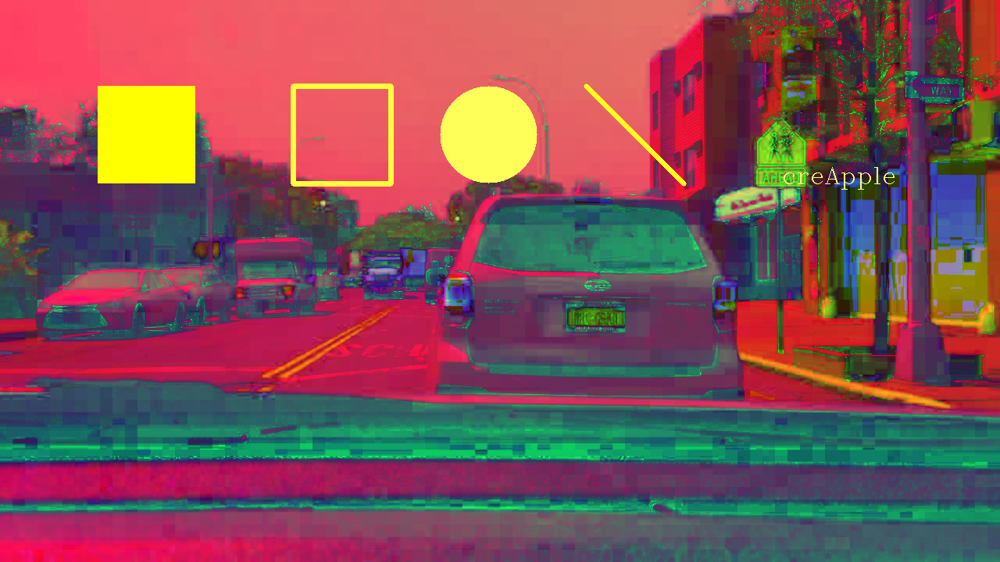

In [ ]:
hav = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
cv2_imshow(hav)

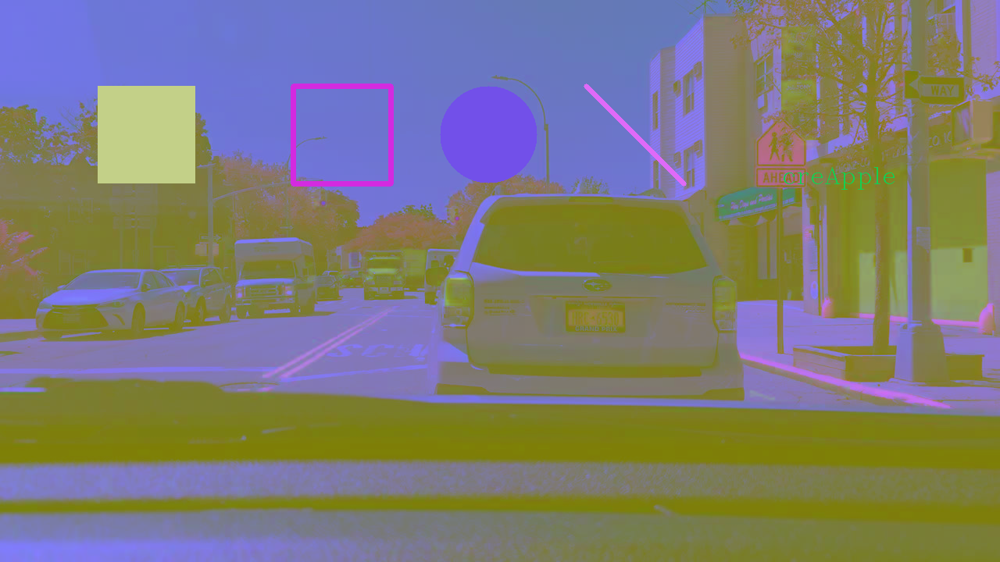

In [ ]:
lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
cv2_imshow(lab)

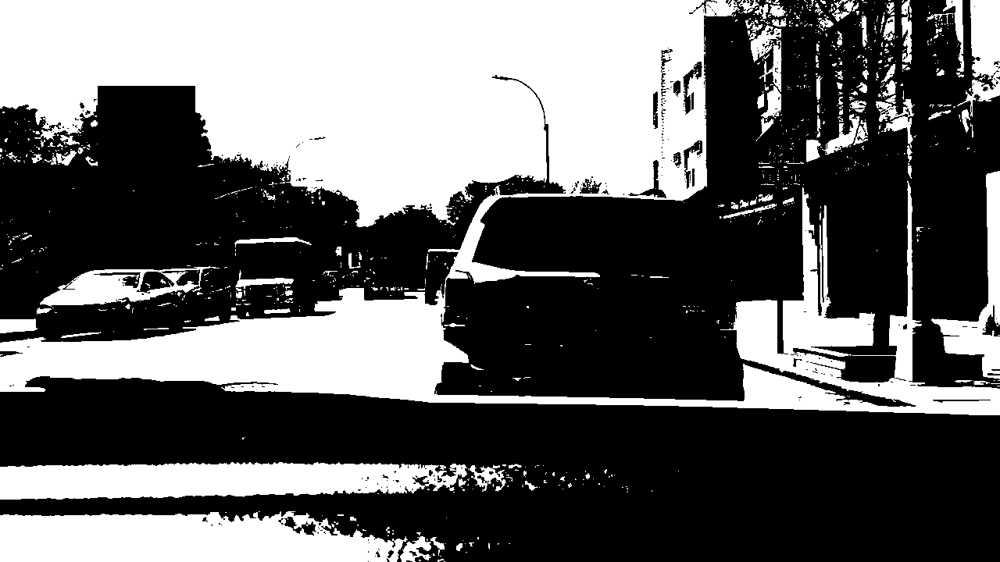

In [ ]:
ret, thresh = cv2.threshold(gray, 127, 255, 0)
cv2_imshow(thresh)

1370


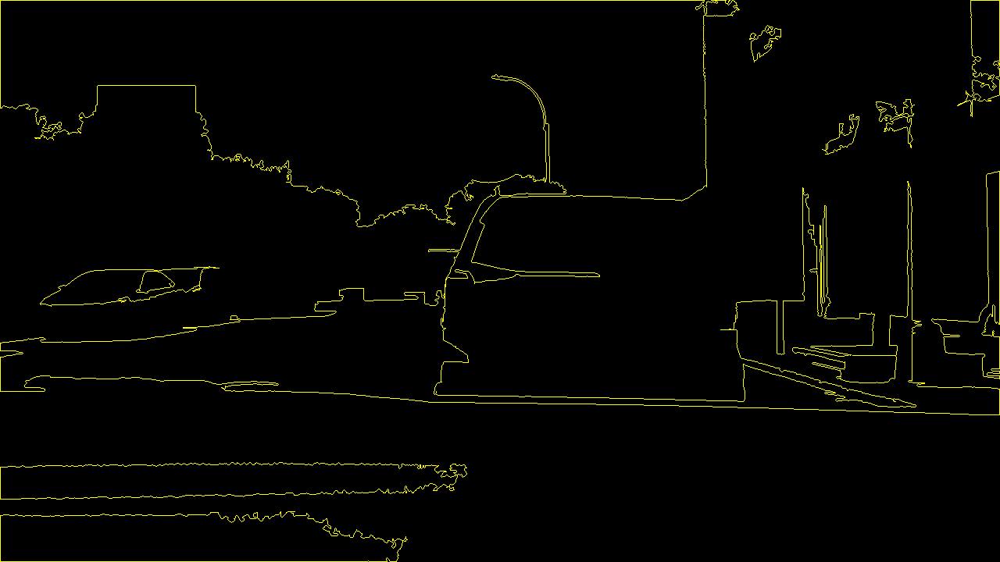

In [ ]:
coutours, hierarchy = cv2.findContours(thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
print(len(coutours))
coutours = sorted(coutours, key=cv2.contourArea, reverse = True)[:10]
back = np.zeros((height, width, 3), np.uint8)
for i in range(len(coutours)):
  cv2.drawContours(back, coutours, i, (0, 255, 255))
cv2_imshow(back)

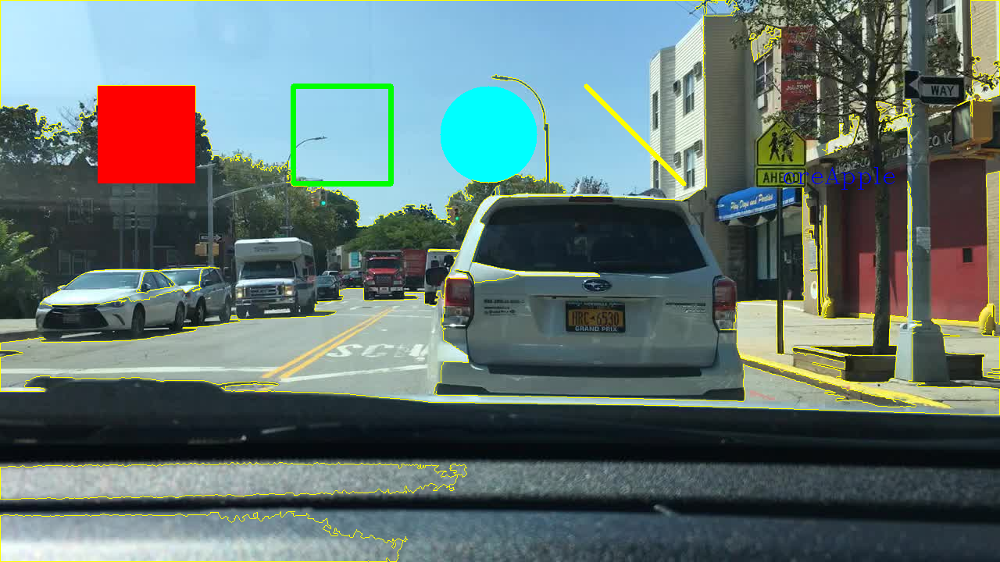

In [ ]:
for i in range(len(coutours)):
  cv2.drawContours(img, coutours, i, (0, 255, 255))
cv2_imshow(img)